# Simulation

##Setup and Pseudocode

Step 1
- create a Uniformly distributed collection of 500,000,000 observations
- this will be our **population**



Step 2
- now we create our sample of size 10000
- select 100 random observations from the population
- calculate the sample mean
- we need to repeat the above 2 steps a large number of times to get a sufficiently large set of sample means; let's aim to get a set of 10000 sample means


Step 3
- we calculate the mean (m) and the std deviation (s) of the set of sample means
- we apply the transformation (x-m)/s to each observation x in our set of sample means
- acc to CLT, the distribution of the resultant (mean-centred and std dev scaled) set of sample means should approach the Standard Normal Distribution

##Simulation

In [1]:
#importing libraries

import numpy as np
import random
import matplotlib.pyplot as plt


In [2]:
#step-1

cont_uniform_population = np.random.uniform(0,10,500000000)
print(type(cont_uniform_population))
print(cont_uniform_population[:5])
print(np.mean(cont_uniform_population),np.std(cont_uniform_population)**2)


<class 'numpy.ndarray'>
[4.52532738 5.34526616 8.52836492 9.76249588 0.47417808]
5.0000036368788106 8.333221994600901


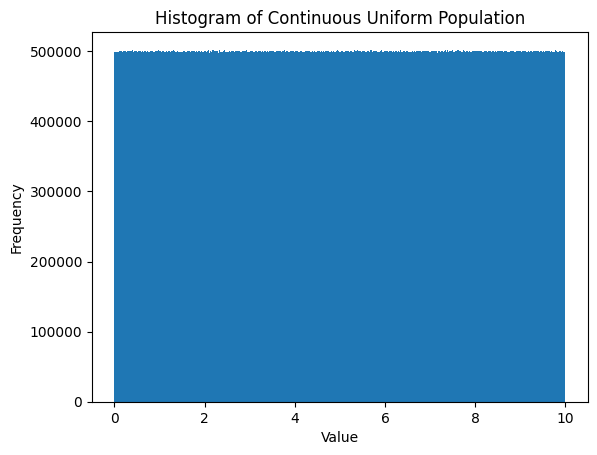

In [4]:
# plot cont_uniform_population

plt.hist(cont_uniform_population, bins=1000)
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Histogram of Continuous Uniform Population")
plt.show()


In [7]:
#step-2

sample_means = []

for samples in range(10000):

  sample = []

  for each in range(100):
    sample.append(random.choice(cont_uniform_population))

  mean = np.mean(sample)
  sample_means.append(mean)


print(len(sample_means))

10000


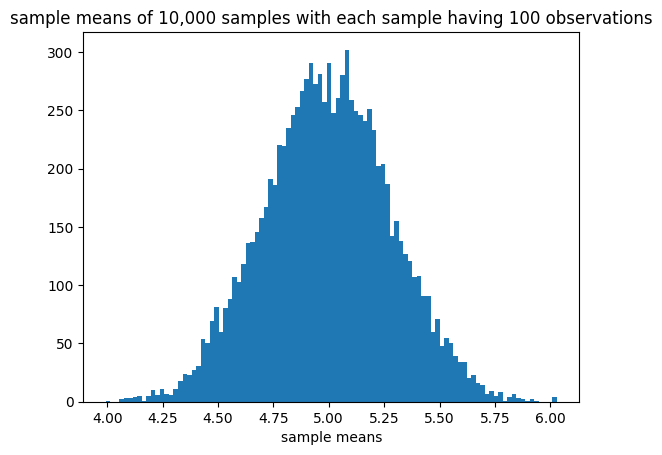

4.994694272056789 0.28582899571060416
5.552891479965183e-16 0.9999999999999999


In [8]:
#step-3

arr_sample_means = np.array(sample_means)

plt.hist(arr_sample_means,bins=100)
plt.title('sample means of 10,000 samples with each sample having 100 observations')
plt.xlabel('sample means')
plt.show()

m = np.mean(arr_sample_means)
s = np.std(arr_sample_means)
print(m, s)

std_arr_sample_means = (arr_sample_means-m)/s

print(np.mean(std_arr_sample_means),np.std(std_arr_sample_means))

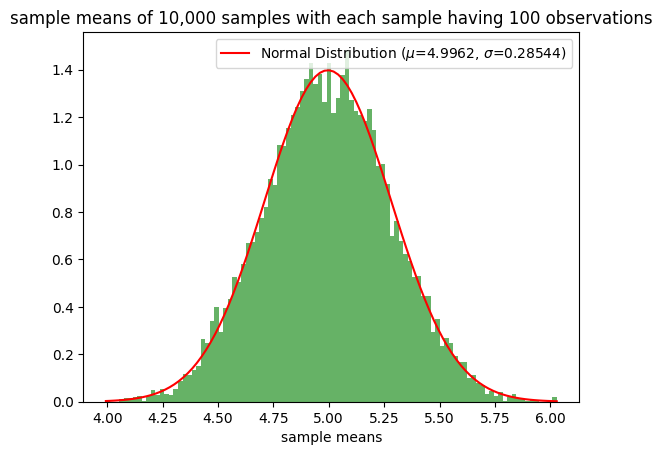

4.994694272056789 0.28582899571060416
5.552891479965183e-16 0.9999999999999999


In [9]:
#plot a histogram of arr_sample_means, and superimpose a normal distribution with mean 4.9962 and std_dev 0.28544 on it

import numpy as np
import random
import matplotlib.pyplot as plt
from scipy.stats import norm


#step-3

arr_sample_means = np.array(sample_means)

plt.hist(arr_sample_means, bins=100, density=True, alpha=0.6, color='g') #density=True for normalized histogram
plt.title('sample means of 10,000 samples with each sample having 100 observations')
plt.xlabel('sample means')

# Superimpose the normal distribution
x = np.linspace(min(arr_sample_means), max(arr_sample_means), 100)
mean = 4.9962  # Provided mean
std_dev = 0.28544 # Provided std dev
plt.plot(x, norm.pdf(x, mean, std_dev), 'r', label='Normal Distribution ($\mu$=4.9962, $\sigma$=0.28544)')
plt.legend()

plt.show()

m = np.mean(arr_sample_means)
s = np.std(arr_sample_means)
print(m, s)

std_arr_sample_means = (arr_sample_means-m)/s

print(np.mean(std_arr_sample_means),np.std(std_arr_sample_means))


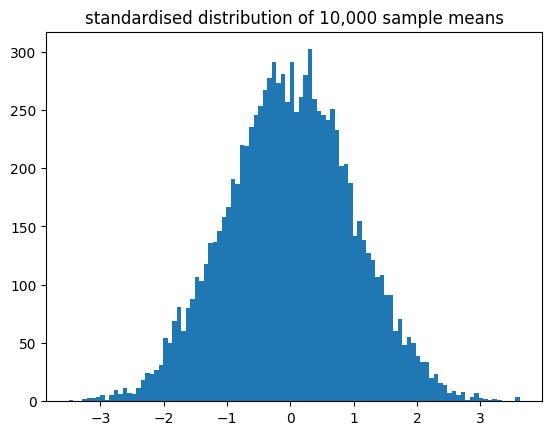

In [10]:
plt.hist(std_arr_sample_means,bins=100)
plt.title('standardised distribution of 10,000 sample means')
plt.show()

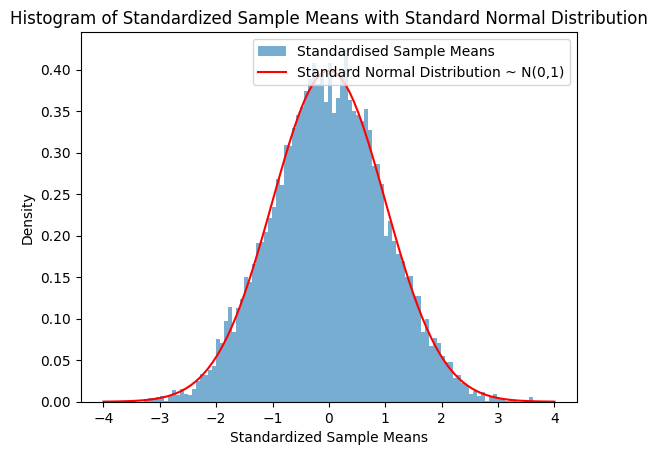

In [11]:
#plot a histogram of std_arr_sample_means, and superimpose a standard normal distribution on it

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming std_arr_sample_means is already calculated from the previous code

# Generate x-values for the standard normal distribution
x = np.linspace(-4, 4, 100)  # Adjust the range as needed

# Calculate the probability density function (PDF) of the standard normal distribution
y = norm.pdf(x)


# Plot the histogram
plt.hist(std_arr_sample_means, bins=100, density=True, alpha=0.6, label='Standardised Sample Means') #density=True to normalize

# Superimpose the standard normal distribution
plt.plot(x, y, label='Standard Normal Distribution ~ N(0,1)', color='red')

plt.title('Histogram of Standardized Sample Means with Standard Normal Distribution')
plt.xlabel('Standardized Sample Means')
plt.ylabel('Density')
plt.legend()
plt.show()


##Verifying the Normality of the Distribution of Mean Centred and Std Dev Scaled Sample Means Using Skewness and Kurtosis

The Standard Normal Distribution is symmetric and mesokurtic. This means that it has a skewness of 0 and a kurtosis of 3 (equivalently and excess kurtosis of 0).

- The skewness score is a measure of how symmetric a distribution is
- The kurtosis score is a measure of how peaked a distribution is

In [12]:
import scipy

In [13]:
print(f'skewness is {scipy.stats.skew(std_arr_sample_means)}')
print(f'kurtosis is {scipy.stats.kurtosis(std_arr_sample_means, fisher=False)}')

skewness is 0.0018370105559780761
kurtosis is 2.9172300635674038


Hence, the distribution approximates a Standard Normal Distribution, i.e., N(0,1)

In [14]:
#test the normality of std_arr_sample_means using Jarque Bera test

import numpy as np
import random
import matplotlib.pyplot as plt
import scipy
from scipy.stats import jarque_bera


# Perform Jarque-Bera test
jb_statistic, p_value = jarque_bera(std_arr_sample_means)

print(f"Jarque-Bera statistic: {jb_statistic}")
print(f"P-value: {round(p_value,5)}")

alpha = 0.05  # significance level

if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")



Jarque-Bera statistic: 2.8601503367446335
P-value: 0.23929
Sample looks Gaussian (fail to reject H0)


##Checking the effect of sample size on the normality of the distribution of sample means

Step 1
- create a Uniformly distributed collection of 500,000,000 observations
- this will be our population



Step 2

Create a function that does the following:

- now we create our sample of size 2500
- select random observations from the population of varying sizes - [1,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
- calculate the sample mean
- repeat the above 3 steps


<br>

- we calculate the mean (m) and the std deviation (s) of the set of sample means
- we apply the transformation (x-m)/s to each observation x in our set of sample means
- acc to CLT, the distribution of the resultant (mean-centred and std dev scaled) set of sample means should approach the Standard Normal Distribution

<br>

- Check the p-value using the Jarque Bera test for each sample size and plot it using a line chart

(Here we are taking the p-value of the Jarque Bera test as a proxy of how well the distribution approximates a Normal distribution)

In [15]:
#step-1

cont_uniform_population = np.random.uniform(0,10,500000000)
print(type(cont_uniform_population))
print(cont_uniform_population[:5])
print(np.mean(cont_uniform_population),np.std(cont_uniform_population)**2)

<class 'numpy.ndarray'>
[7.32531537 0.89513499 7.89974869 7.99987546 6.17460832]
4.999970384403713 8.33351532494116


In [16]:

def CLT_normality_vs_sample_size(ss_list):


  '''
  The population from which we sample is specified as cont_uniform_population in step-1 above./
  It is a uniform continuous distribution taking values from 0 to 10.

  INPUTS:
  - ss_list is list of sample sizes to be considered

  OUTPUT:
  - list of (x,y) tuples where x is the sample size and y is the p-value

  '''

  ss_p_list = []

#for loop over each sample size in ss_list
  for size in ss_list:


    #1 generating samples
    sample_means = []


    for samples in range(2500):
      sample = []

      for each in range(size):
        sample.append(random.choice(cont_uniform_population))

      mean = np.mean(sample)
      sample_means.append(mean)


    #2 converting sample means to numpy arrat
    arr_sample_means = np.array(sample_means)

    m = np.mean(arr_sample_means)
    s = np.std(arr_sample_means)

    #standardising sample means array
    std_arr_sample_means = (arr_sample_means-m)/s


    # Performing Jarque-Bera test
    jb_statistic, p_value = jarque_bera(std_arr_sample_means)

    ss_p_list.append((size,p_value))

  return ss_p_list




In [22]:
#test

samples = [1,5,10,15]
out = CLT_normality_vs_sample_size(samples)
print(out)



[(1, np.float64(7.271266890516071e-35)), (5, np.float64(0.20335044835538382)), (10, np.float64(0.16362211373047186)), (15, np.float64(0.8034601981939551))]


In [17]:
samples = [1,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]

#out = CLT_normality_vs_sample_size(samples)

In [18]:
#averaging out the p-values for each sample size over 100 repetitions

p_values_list = [0 for i in range(21)]

for i in range(100):

  out = CLT_normality_vs_sample_size(samples)

  for j in range(21):
    p_values_list[j] += out[j][-1]


final_out_list = [(s,p/100) for s,p in zip(samples,p_values_list)]

print(final_out_list)
print(len(final_out_list))


[(1, np.float64(8.120524979950281e-32)), (5, np.float64(0.056366101924275346)), (10, np.float64(0.37684568866551027)), (15, np.float64(0.440153977294361)), (20, np.float64(0.43272979424098723)), (25, np.float64(0.48619752654127196)), (30, np.float64(0.45638830165030286)), (35, np.float64(0.525516015457282)), (40, np.float64(0.48350435542301695)), (45, np.float64(0.4564774363529817)), (50, np.float64(0.5309187834722173)), (55, np.float64(0.5203216673801689)), (60, np.float64(0.4617669040880502)), (65, np.float64(0.4585001158165293)), (70, np.float64(0.5302546914596216)), (75, np.float64(0.503057641370619)), (80, np.float64(0.4780791151701698)), (85, np.float64(0.49006118890640876)), (90, np.float64(0.49907323933405867)), (95, np.float64(0.498753316824267)), (100, np.float64(0.4997429274939092))]
21


In [19]:
for i,j in final_out_list:
  print(round(j,7))

0.0
0.0563661
0.3768457
0.440154
0.4327298
0.4861975
0.4563883
0.525516
0.4835044
0.4564774
0.5309188
0.5203217
0.4617669
0.4585001
0.5302547
0.5030576
0.4780791
0.4900612
0.4990732
0.4987533
0.4997429


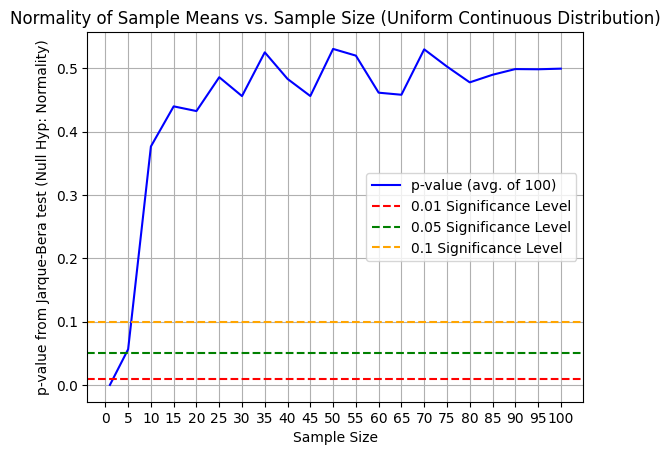

In [21]:
# prompt: plot a line chart using out with (x,y) such that x is on x axis, y is on y axis. Show different coloured lines of 0.01, 0.05, and 0.1 across the chart as level of significance

import matplotlib.pyplot as plt

# Assuming 'out' is the list of (x, y) tuples from the previous code

x_values, y_values = zip(*final_out_list)

plt.plot(x_values, y_values, label='p-value (avg. of 100)', color='blue')

# Plot horizontal lines for significance levels
plt.axhline(y=0.01, color='red', linestyle='--', label='0.01 Significance Level')
plt.axhline(y=0.05, color='green', linestyle='--', label='0.05 Significance Level')
plt.axhline(y=0.1, color='orange', linestyle='--', label='0.1 Significance Level')

plt.xlabel('Sample Size')
plt.ylabel('p-value from Jarque-Bera test (Null Hyp: Normality)')
plt.title('Normality of Sample Means vs. Sample Size (Uniform Continuous Distribution)')
plt.xticks([0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100])
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
#jarque_bera

Therefore, if the above simulation has been performed correctly -

We find that for a sum of as low 5 IID uniform RVs, the distribution approximates a Normal Distribution such that the null hypothesis of normality in the Jarque Bera test will not be rejected even at the 10% level of significance.

# Example Problem - Comparing CLT with a Simulation

##PROBLEM

You throw a 6 sided fair die 100 times:

<br>
FOR EACH TURN -

-1 step : if 1,2 show up

+1 step : if 3,4,5 show up

if 6 shows up - throw the dice again & take the number of steps that show up

<br>
In 100 turns, how likely is it that you have moved 60 or more steps?



##Approach 1 - Using Central Limit Theorem

In [23]:
import numpy as np

#we can model each turn as the following random variable: x - outcomes, prob_x - probability of each outcome

x = np.array([-1,1,2,3,4,5,6])
prob_x = np.array([1/3,19/36,1/36,1/36,1/36,1/36,1/36])

#here we have assumed a uniform probability distribution

EV = np.sum(x * prob_x)
print(EV)

0.7499999999999999


Therefore, mean of the RV is 0.7499

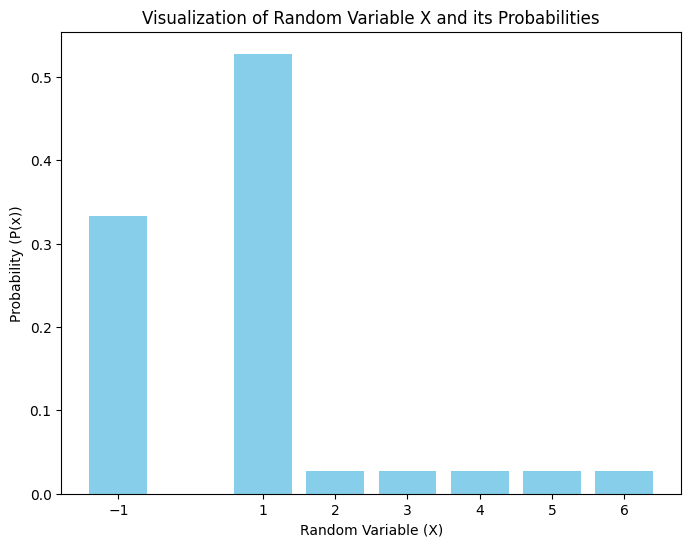

In [24]:
#visualise the random variable X and show probabilities captured in prob_x

import matplotlib.pyplot as plt

# Assuming x and prob_x are defined as in the provided code
x = np.array([-1, 1, 2, 3, 4, 5, 6])
prob_x = np.array([1/3, 19/36, 1/36, 1/36, 1/36, 1/36, 1/36])

plt.figure(figsize=(8, 6))
plt.bar(x, prob_x, color='skyblue')
plt.xlabel("Random Variable (X)")
plt.ylabel("Probability (P(x))")
plt.title("Visualization of Random Variable X and its Probabilities")
plt.xticks(x)  # Ensure all x values are displayed
plt.show()


In [25]:
mean_dev = x - EV
sq_mean_dev = mean_dev ** 2
print(mean_dev)
print(sq_mean_dev)

VAR = np.sum(sq_mean_dev * prob_x)
print(VAR)


[-1.75  0.25  1.25  2.25  3.25  4.25  5.25]
[ 3.0625  0.0625  1.5625  5.0625 10.5625 18.0625 27.5625]
2.7986111111111107


Therefore, variance of the RV is 2.7986

We can say that 100 turns can be simulated by summing up IID X random variables 100 times.
Using Central Limit Theorem, this can be approximated using a Normal random variable with mean as 100 x EV and variance 100 x VAR

In [26]:
#find the probability of a normal distribution with mean (100*EV) and variance (100*VAR) taking values >= 60

from scipy.stats import norm

# Given values
EV = np.sum(x * prob_x)
VAR = np.sum(sq_mean_dev * prob_x)

# Calculate mean and standard deviation of the normal distribution
mean = 100 * EV
var = 100 * VAR
std_dev = np.sqrt(var)
print(f'mean, variance and std_dev of the sum of 100 IID turns are -')
print(f'mean = {round(mean,4)}, variance = {round(var,4)}, std_dev = {round(std_dev,4)} \n')

# Calculate the probability of values greater than or equal to 60
probability = 1 - norm.cdf(59.9, loc=mean, scale=std_dev)

print(f"The probability of the normal distribution with mean {round(mean,4)} and standard deviation {round(std_dev,4)} taking values >= 60 is: {round(probability,4)}")


mean, variance and std_dev of the sum of 100 IID turns are -
mean = 75.0, variance = 279.8611, std_dev = 16.729 

The probability of the normal distribution with mean 75.0 and standard deviation 16.729 taking values >= 60 is: 0.8166


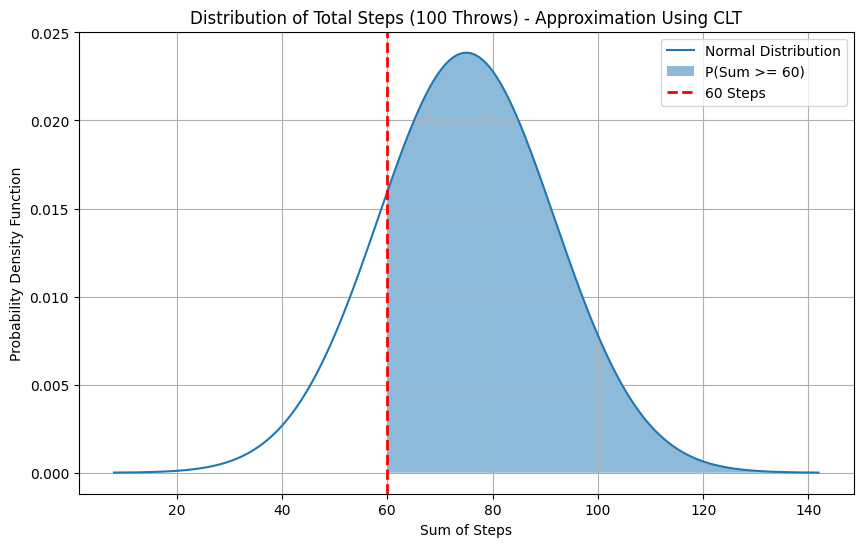

In [28]:
#visualise x and prob_x

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming x and prob_x are defined as in your provided code
x = np.array([-1, 1, 2, 3, 4, 5, 6])
prob_x = np.array([1/3, 19/36, 1/36, 1/36, 1/36, 1/36, 1/36])

# Calculate the expected value (mean)
EV = np.sum(x * prob_x)

# Calculate the variance
variance = np.sum(((x - EV)**2) * prob_x)

# Calculate the standard deviation
std_dev = np.sqrt(variance)

# Number of trials
n = 100

# Expected value of the sum of 100 trials
expected_value_sum = n * EV

# Standard deviation of the sum of 100 trials
std_dev_sum = np.sqrt(n) * std_dev

# Visualize
plt.figure(figsize=(10, 6))

# Create x-values for the plot
x_values = np.linspace(expected_value_sum - 4 * std_dev_sum, expected_value_sum + 4 * std_dev_sum, 500)

# Plot the normal distribution
plt.plot(x_values, norm.pdf(x_values, loc=expected_value_sum, scale=std_dev_sum), label='Normal Distribution')

# Shade the region where the sum is 60 or more
plt.fill_between(x_values[x_values >= 60], 0, norm.pdf(x_values[x_values >= 60], loc=expected_value_sum, scale=std_dev_sum), alpha=0.5, label='P(Sum >= 60)')

# Add labels and title
plt.xlabel('Sum of Steps')
plt.ylabel('Probability Density Function')
plt.title('Distribution of Total Steps (100 Throws) - Approximation Using CLT')

# Add a vertical line at 60
plt.axvline(x=60, color='red', linestyle='dashed', linewidth=2, label='60 Steps')

# Show legend
plt.legend()
plt.grid(True)
plt.show()


The probability of getting a value of 60 or higher using this approach is approximately 81.5%

##Approach 2 - Simulation

seed(): sets the random seed, so that your results are reproducible between simulations. As an argument, it takes an integer of your choosing. If you call the function, no output will be generated.

rand(): if you don't specify any arguments, it generates a random float between zero and one.

In [ ]:
import numpy as np

In [ ]:
#generating random numbers to simulate a die

die = np.random.randint(1,7)

#simulating 100 dice throws, and repeating it 1,000,000 times to get a distribution

step_distribution = []

step_distribution_sample = []

for i in range(1000000):

  step = 0

  for j in range(100):

    die = np.random.randint(1,7)

    if die == 1 or die == 2:
      step = step - 1

    elif die == 3 or die == 4 or die == 5:
      step = step + 1

    else:
      step = step + np.random.randint(1,7)

  step_distribution.append(step)

  if i%100000 == 0:
    step_distribution_sample.append(step)



In [ ]:
count = 0

for i in step_distribution:
  if i >= 60:
    count += 1

print(count/len(step_distribution))

0.82193


Therefore, as per the simulation, around 82.2% of steps are >= 60. This is close to the CLT simulation solution of 81.7%. The slight discrepancy may be due to the fact that we are trying to approximate a discrete distribution using a continuous RV.

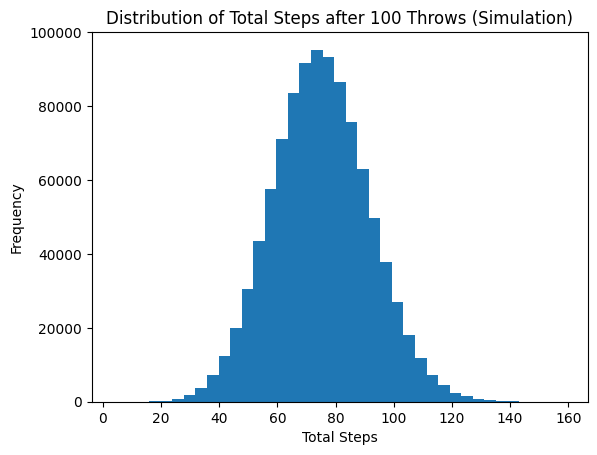

In [ ]:
#plot distribution for step_distribution

import matplotlib.pyplot as plt

# Assuming step_distribution is already calculated from the previous code

plt.hist(step_distribution, bins=39)  # Adjust bins as needed
plt.title('Distribution of Total Steps Taken After 100 Throws (Simulation)')
plt.xlabel('Total Steps')
plt.ylabel('Frequency')
plt.show()


In [ ]:
steps_array = np.array(step_distribution)

In [ ]:
m = np.mean(steps_array)
print(f'mean is {m}')
s = np.std(steps_array)
print(f'std deviation is {s}')

#standardising sample means array
std_steps_array = (steps_array-m)/s

mean is 74.993327
std deviation is 16.73578992671308


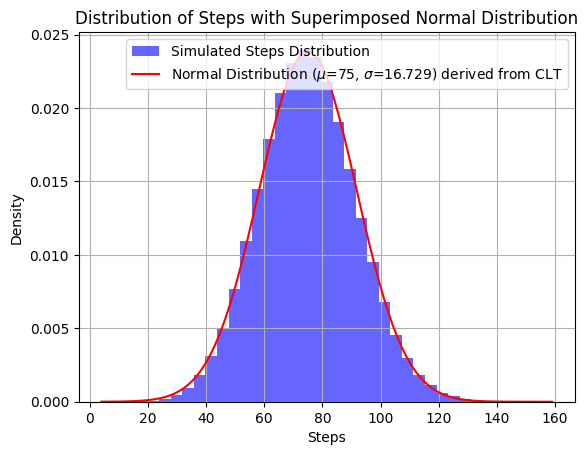

In [ ]:
#show distribution of steps_array and superimpose normal distribution (mean 75, stdev 16.729) on the distribution

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming step_distribution is already calculated and stored in steps_array
# ... (your existing code to generate steps_array) ...

# Provided mean and standard deviation for the normal distribution
mean = 75
std_dev = 16.729

# Create the histogram
plt.hist(steps_array, bins=39, density=True, alpha=0.6, color='b', label='Simulated Steps Distribution')

# Superimpose the normal distribution
x = np.linspace(min(steps_array), max(steps_array), 100)
plt.plot(x, norm.pdf(x, mean, std_dev), 'r', label=f'Normal Distribution ($\mu$={mean}, $\sigma$={std_dev}) derived from CLT')


# Add labels, title, and legend
plt.xlabel('Steps')
plt.ylabel('Density')
plt.title('Distribution of Steps with Superimposed Normal Distribution')
plt.legend()
plt.grid(True)
plt.show()


###Random Walk Visualisation

In [ ]:
#generating random numbers to simulate a die

die = np.random.randint(1,7)

#simulating 100 dice throws, and repeating it 100 times to get a distribution

random_walks = []


for i in range(75):

  random_walk = [0]

  step = random_walk[-1]

  for j in range(100):

    die = np.random.randint(1,7)

    if die == 1 or die == 2:
      step = step - 1

    elif die == 3 or die == 4 or die == 5:
      step = step + 1

    else:
      step = step + np.random.randint(1,7)

    random_walk.append(step)


  random_walks.append(random_walk)





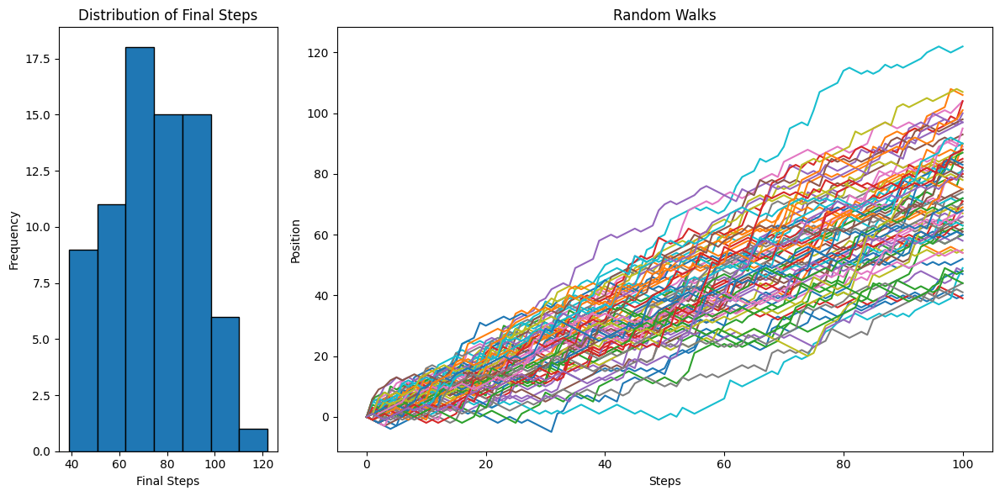

In [ ]:
visualise random_walks and on the left show a distribution of the final number of steps

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'width_ratios': [1, 3]})

# Plot the distribution of final steps on the left subplot
final_steps = [walk[-1] for walk in random_walks]
axes[0].hist(final_steps, bins=7, edgecolor='black')
axes[0].set_title('Distribution of Final Steps')
axes[0].set_xlabel('Final Steps')
axes[0].set_ylabel('Frequency')

# Plot random walks on the right subplot
for walk in random_walks:
    axes[1].plot(walk)

axes[1].set_title('Random Walks')
axes[1].set_xlabel('Steps')
axes[1].set_ylabel('Position')

plt.tight_layout()
plt.show()


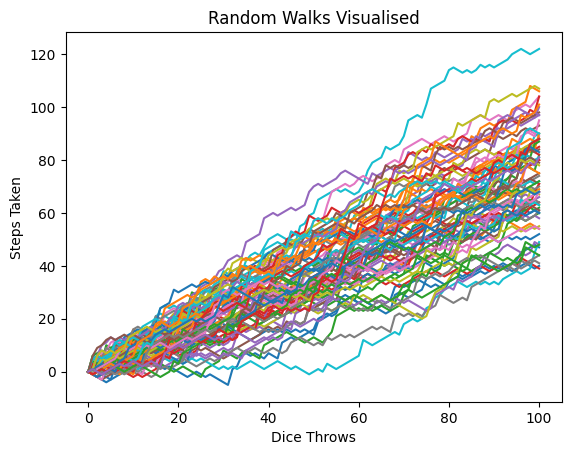

In [ ]:
#visualising different random walks

import numpy as np

np_random_walks = np.array(random_walks)

np_random_walks_trans = np.transpose(np_random_walks)


import matplotlib.pyplot as plt

plt.plot(np_random_walks_trans)

plt.xlabel('Dice Throws')
plt.ylabel('Steps Taken')
plt.title('Random Walks Visualised')

plt.show()



# Written Discussion - Percentiles VS Confidence Intervals

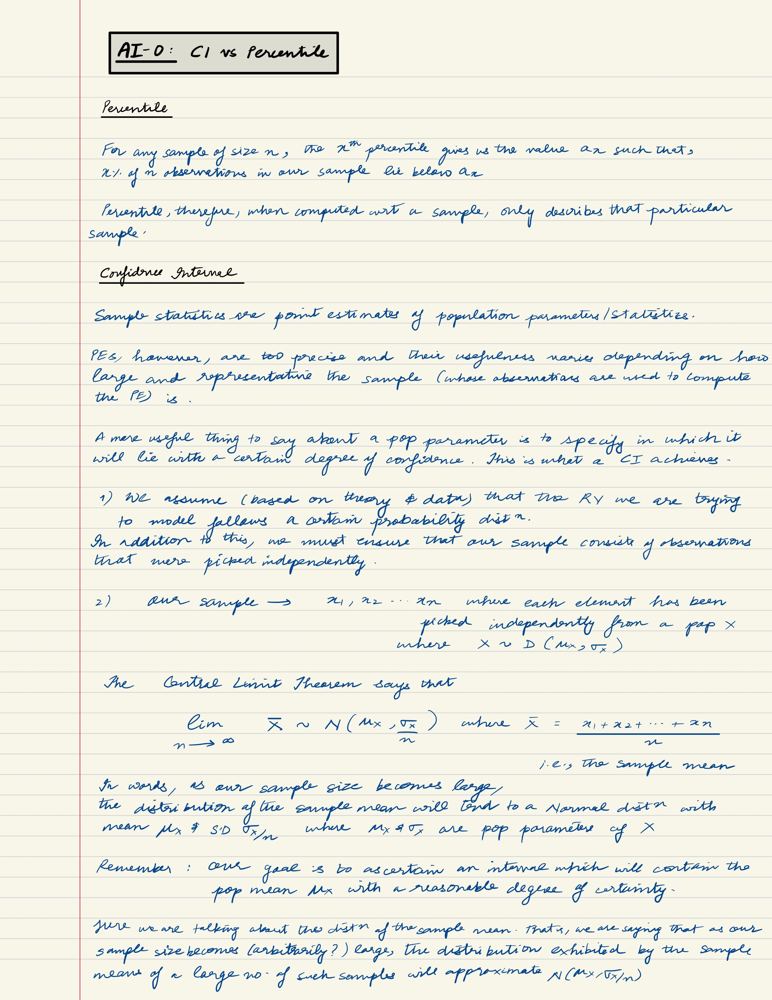

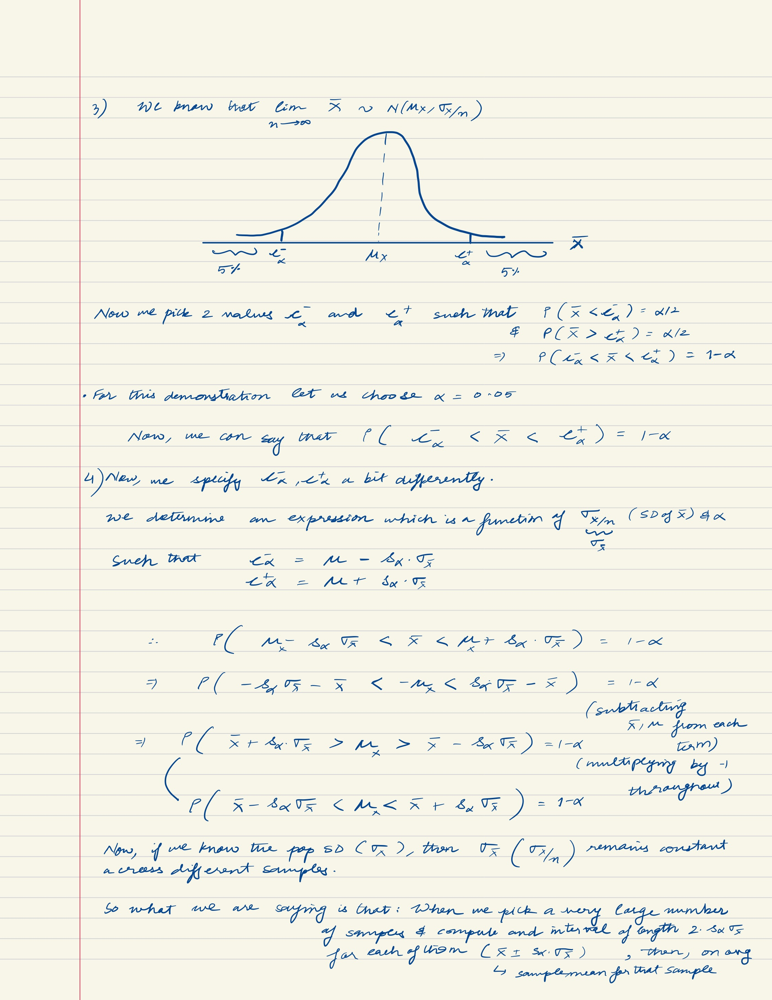

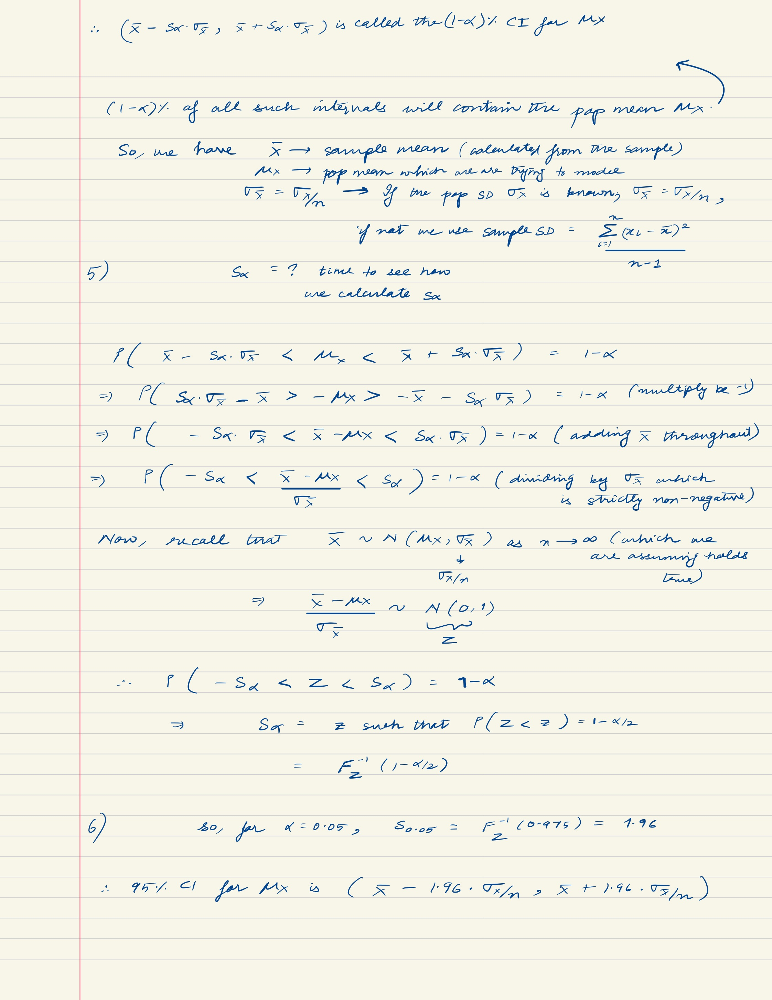